##### Copyright 2023 The MediaPipe Authors. All Rights Reserved.

In [ ]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Pose Landmarks Detection with MediaPipe Tasks

This notebook shows you how to use MediaPipe Tasks Python API to detect pose landmarks from images.

## Preparation

Let's start with installing MediaPipe.


In [1]:
!pip install -q mediapipe==0.10.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.9/33.9 MB 37.5 MB/s eta 0:00:00


In [10]:
!pip install tqdm

Then download an off-the-shelf model bundle. Check out the [MediaPipe documentation](https://developers.google.com/mediapipe/solutions/vision/pose_landmarker#models) for more information about this model bundle.

In [2]:
!wget -O pose_landmarker.task -q https://storage.googleapis.com/mediapipe-models/pose_landmarker/pose_landmarker_heavy/float16/1/pose_landmarker_heavy.task

## Visualization utilities

In [3]:
#@markdown To better demonstrate the Pose Landmarker API, we have created a set of visualization tools that will be used in this colab. These will draw the landmarks on a detect person, as well as the expected connections between those markers.

from mediapipe import solutions
from mediapipe.framework.formats import landmark_pb2
import numpy as np


def draw_landmarks_on_image(rgb_image, detection_result):
  pose_landmarks_list = detection_result.pose_landmarks
  annotated_image = np.copy(rgb_image)

  # Loop through the detected poses to visualize.
  for idx in range(len(pose_landmarks_list)):
    pose_landmarks = pose_landmarks_list[idx]

    # Draw the pose landmarks.
    pose_landmarks_proto = landmark_pb2.NormalizedLandmarkList()
    pose_landmarks_proto.landmark.extend([
      landmark_pb2.NormalizedLandmark(x=landmark.x, y=landmark.y, z=landmark.z) for landmark in pose_landmarks
    ])
    solutions.drawing_utils.draw_landmarks(
      annotated_image,
      pose_landmarks_proto,
      solutions.pose.POSE_CONNECTIONS,
      solutions.drawing_styles.get_default_pose_landmarks_style())
  return annotated_image

## Download test image

To demonstrate the Pose Landmarker API, you can download a sample image using the follow code. The image is from [Pixabay](https://pixabay.com/photos/girl-woman-fitness-beautiful-smile-4051811/).

In [4]:
# !wget -q -O image.jpg https://cdn.pixabay.com/photo/2019/03/12/20/39/girl-4051811_960_720.jpg

import cv2
from google.colab.patches import cv2_imshow

# img = cv2.imread("image.jpg")
# cv2_imshow(img)

Optionally, you can upload your own image. If you want to do so, uncomment and run the cell below.

In [11]:
from google.colab import files

uploaded = files.upload()

for filename in uploaded:
  content = uploaded[filename]
  with open(filename, 'wb') as f:
    f.write(content)

if len(uploaded.keys()):
  IMAGE_FILE = next(iter(uploaded))
  print('Uploaded file:', IMAGE_FILE)

Saving 000735783.jpg to 000735783 (1).jpg
Saving 000742031.jpg to 000742031 (1).jpg
Saving 000822313.jpg to 000822313 (1).jpg
Saving 001439349.jpg to 001439349 (1).jpg
Saving 002784105.jpg to 002784105 (1).jpg
Saving 002852002.jpg to 002852002 (1).jpg
Saving 003752866.jpg to 003752866 (1).jpg
Saving 003756623.jpg to 003756623 (1).jpg
Saving 003941759.jpg to 003941759 (1).jpg
Saving 004201859.jpg to 004201859 (1).jpg
Saving 005270979.jpg to 005270979 (1).jpg
Saving 006297644.jpg to 006297644 (1).jpg
Saving 006489928.jpg to 006489928 (1).jpg
Saving 006644163.jpg to 006644163 (1).jpg
Saving 006941696.jpg to 006941696 (1).jpg
Saving 007308509.jpg to 007308509 (1).jpg
Saving 007603406.jpg to 007603406 (1).jpg
Saving 008238174.jpg to 008238174 (1).jpg
Saving 008814224.jpg to 008814224 (1).jpg
Saving 011607264.jpg to 011607264 (1).jpg
Saving 011914819.jpg to 011914819.jpg
Saving 012036476.jpg to 012036476.jpg
Saving 012288779.jpg to 012288779.jpg
Saving 013144602.jpg to 013144602.jpg
Saving 0

NameError: ignored

## Running inference and visualizing the results

The final step is to run pose landmark detection on your selected image. This involves creating your PoseLandmarker object, loading your image, running detection, and finally, the optional step of displaying the image with visualizations.

Check out the [MediaPipe documentation](https://developers.google.com/mediapipe/solutions/vision/pose_landmarker/python) to learn more about configuration options that this solution supports.


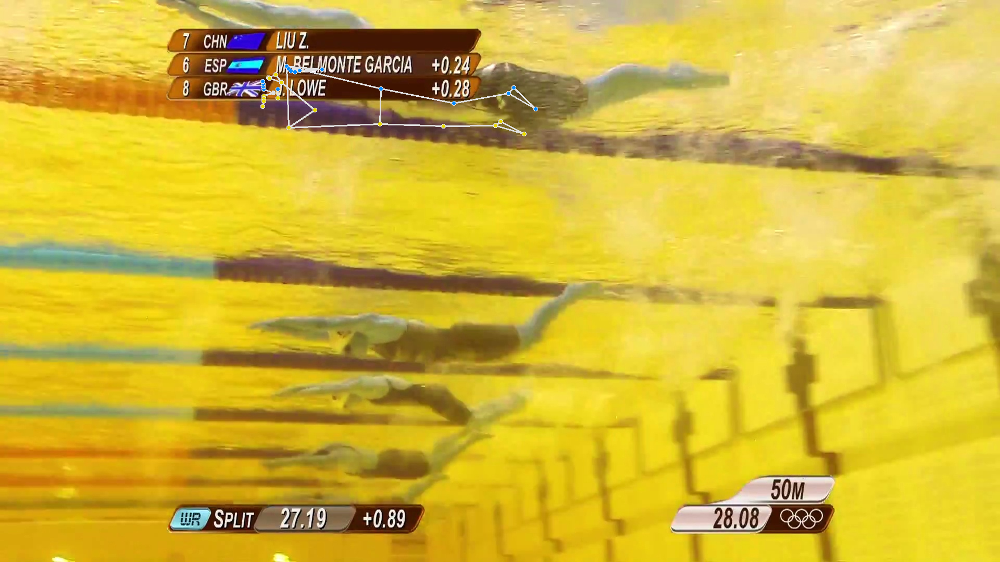

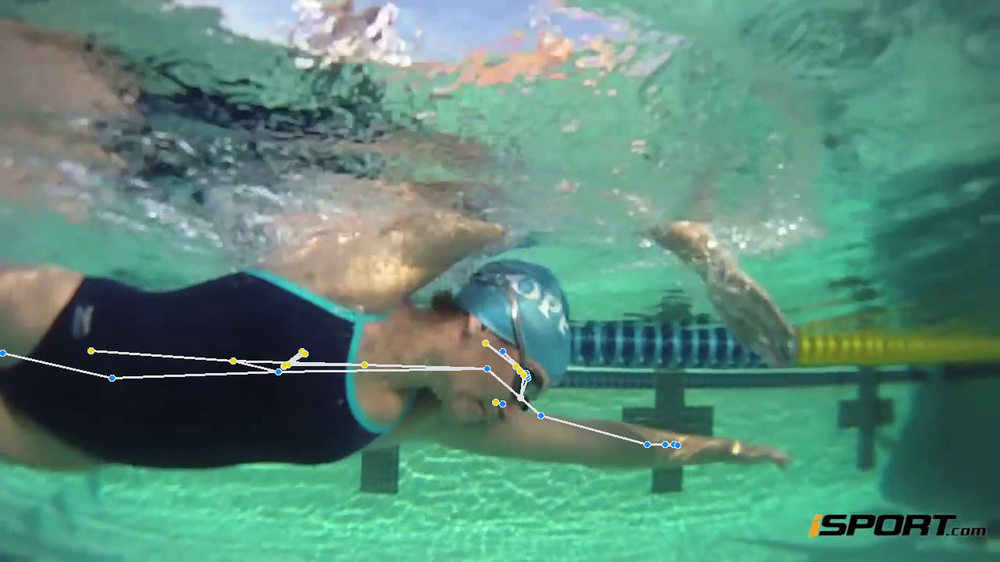

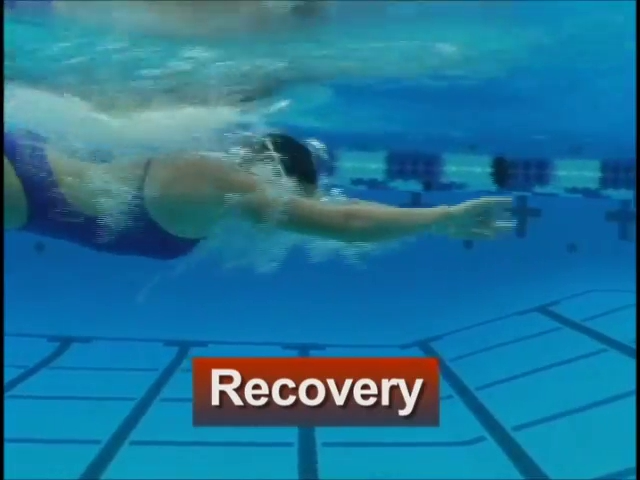

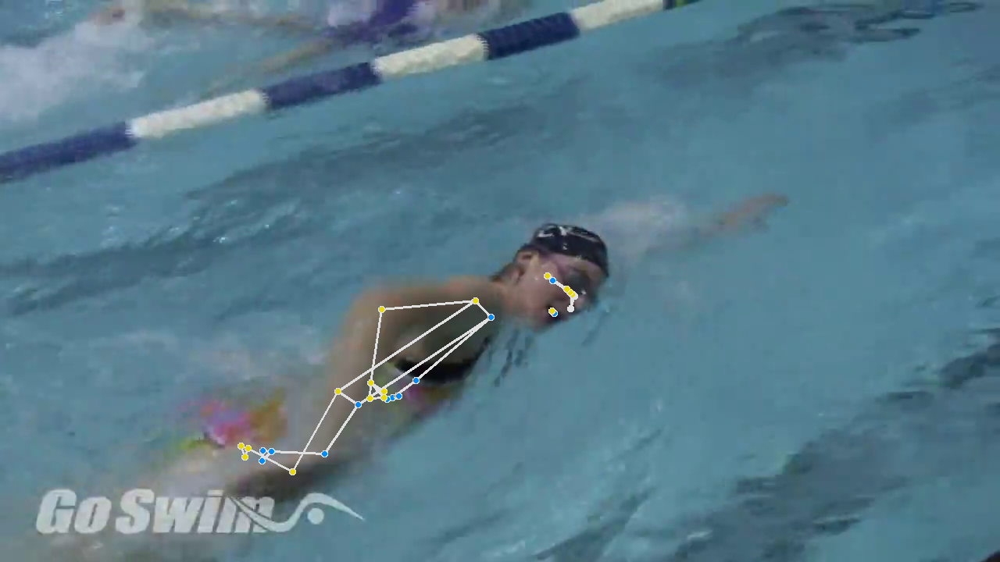

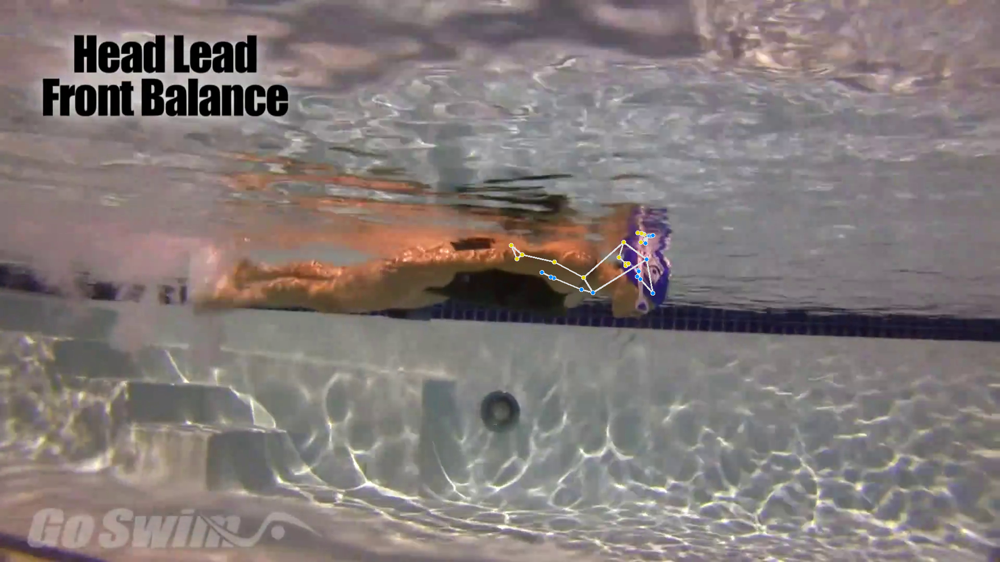

...

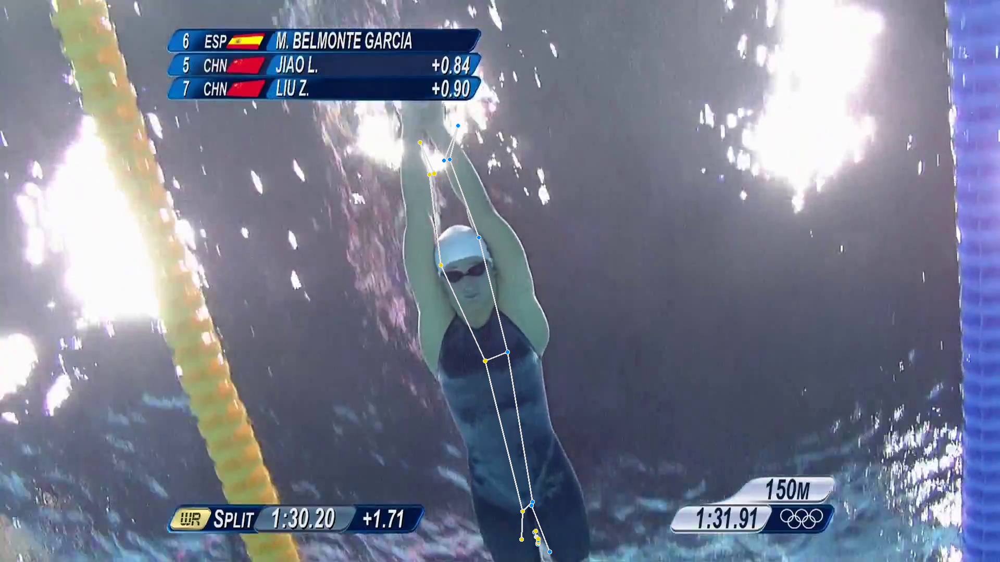

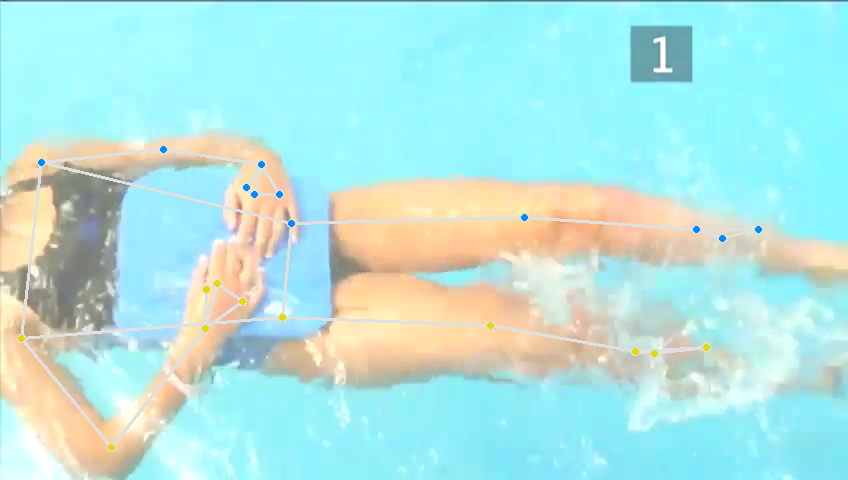

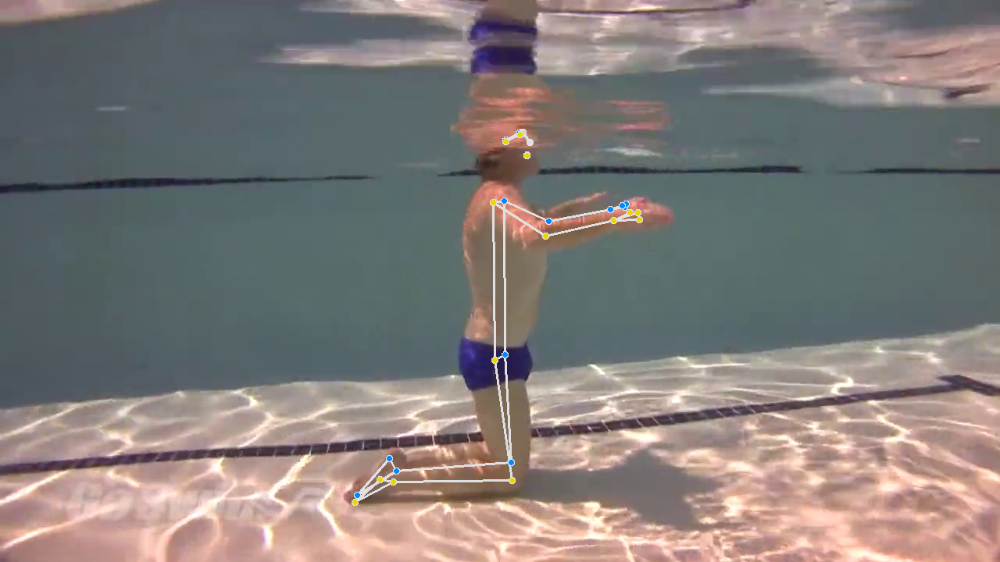

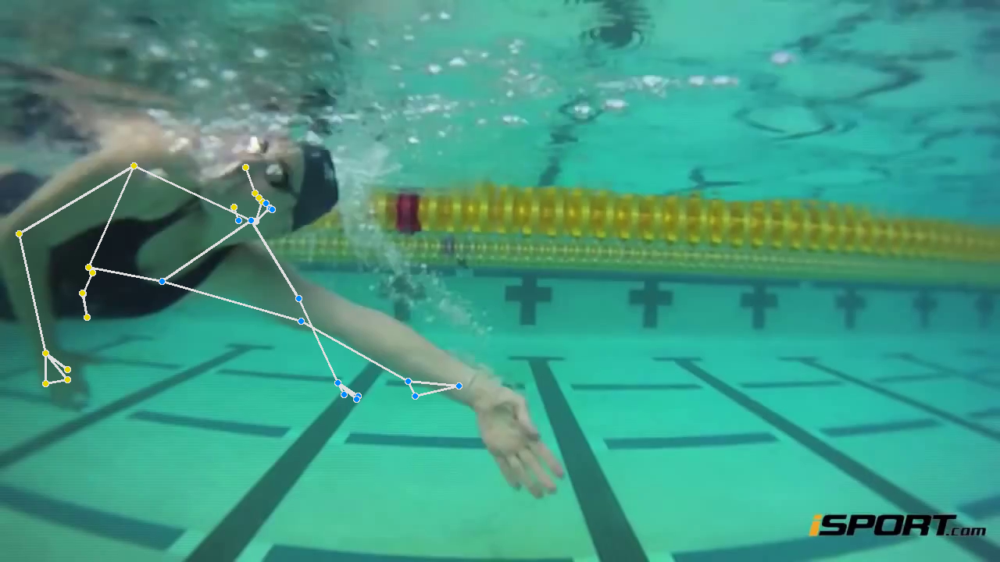

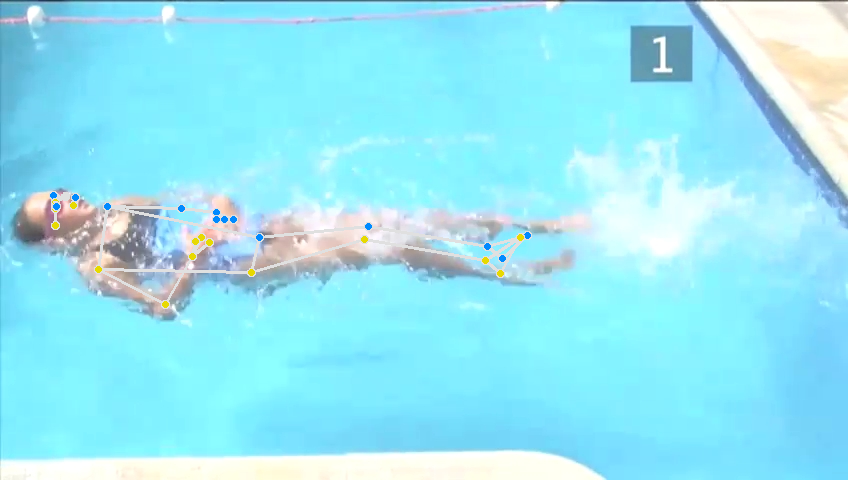

In [28]:
# STEP 1: Import the necessary modules.
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
import os

# STEP 2: Create an PoseLandmarker object.
base_options = python.BaseOptions(model_asset_path='pose_landmarker.task')
options = vision.PoseLandmarkerOptions(
    base_options=base_options,
    output_segmentation_masks=True)
detector = vision.PoseLandmarker.create_from_options(options)

dest = 'predicted_images_mp'
if not os.path.exists(dest):
    # Create a new directory because it does not exist
        os.makedirs(dest)

i = 0
for img in uploaded:
  if i > 10:
    break
# STEP 3: Load the input image.
  image = mp.Image.create_from_file(img)

  # STEP 4: Detect pose landmarks from the input image.
  detection_result = detector.detect(image)

  # STEP 5: Process the detection result. In this case, visualize it.
  annotated_image = draw_landmarks_on_image(image.numpy_view(), detection_result)
  cv2_imshow(cv2.cvtColor(annotated_image, cv2.COLOR_RGB2BGR))
  i += 1


Visualize the pose segmentation mask.

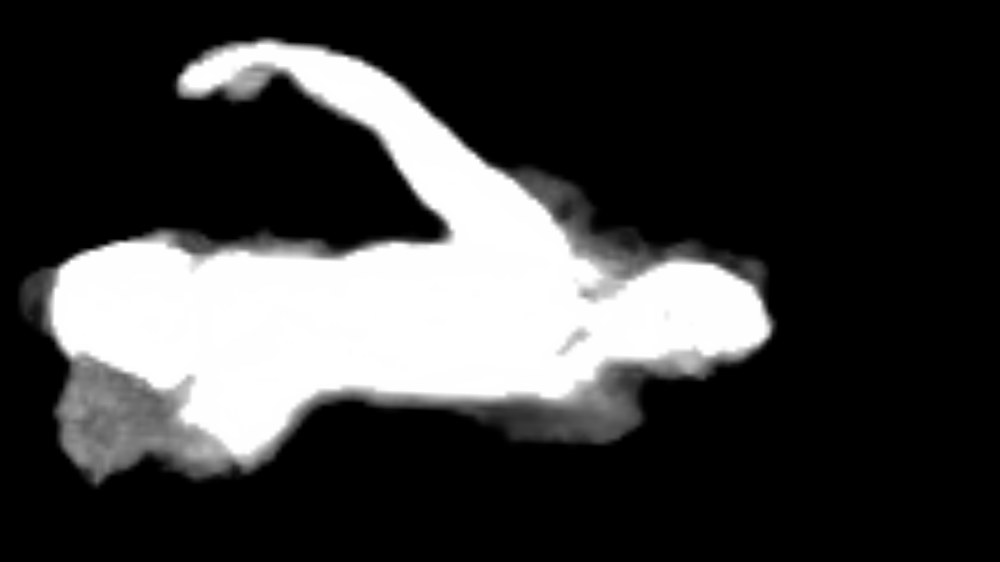

In [ ]:
segmentation_mask = detection_result.segmentation_masks[0].numpy_view()
visualized_mask = np.repeat(segmentation_mask[:, :, np.newaxis], 3, axis=2) * 255
cv2_imshow(visualized_mask)